# Analysis and Forecast on EURUSD, 1H from 2020 to 2024

## Data Preparations

### Importing all necessary libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from datetime import datetime
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from arch import arch_model
from sklearn.metrics import mean_absolute_error, mean_squared_error

### Reading the EURUSD dataset

In [2]:
# reading the dataset using read_csv
df = pd.read_csv("Datasets/EURUSD_1H_2020-2024.csv", 
                 parse_dates=True, 
                 index_col="time")
 
# displaying the first and last five rows of dataset
print(df.head())
print(df.tail())

                        open     high      low    close  tick_volume  spread  \
time                                                                           
2020-01-02 09:00:00  1.12083  1.12095  1.12036  1.12091         1104      16   
2020-01-02 10:00:00  1.12091  1.12130  1.12045  1.12111         1354      16   
2020-01-02 11:00:00  1.12109  1.12132  1.12004  1.12022         1078      16   
2020-01-02 12:00:00  1.12022  1.12030  1.11921  1.11975         1139      16   
2020-01-02 13:00:00  1.11974  1.12014  1.11835  1.11840         1317      16   

                     real_volume  
time                              
2020-01-02 09:00:00            0  
2020-01-02 10:00:00            0  
2020-01-02 11:00:00            0  
2020-01-02 12:00:00            0  
2020-01-02 13:00:00            0  
                        open     high      low    close  tick_volume  spread  \
time                                                                           
2024-08-30 19:00:00  1.10588  1.10

### Creating the year, month, day and hour columns from the dataframe index(time)

In [3]:
df['year'] = df.index.year
df['month'] = df.index.month
df['day'] = df.index.day
df['hour'] = df.index.hour
df.tail()

,open,high,low,close,tick_volume,spread,real_volume,year,month,day,hour
time,,,,,,,,,,,
2024-08-30 19:00:00,1.10588,1.10588,1.10429,1.10486,3859,17,0,2024,8,30,19
2024-08-30 20:00:00,1.10486,1.10558,1.10474,1.10514,2318,17,0,2024,8,30,20
2024-08-30 21:00:00,1.10514,1.10553,1.10486,1.10509,2198,17,0,2024,8,30,21
2024-08-30 22:00:00,1.10509,1.10538,1.10464,1.10516,2595,17,0,2024,8,30,22
2024-08-30 23:00:00,1.10517,1.10542,1.10452,1.10461,1034,17,0,2024,8,30,23


### Data shape

In [4]:
df.shape

(29050, 11)

#### This data has 29,050 rows and 11 columns

### Data description

In [5]:
df.describe()

,open,high,low,close,tick_volume,spread,real_volume,year,month,day,hour
count,29050.000000,29050.000000,29050.000000,29050.000000,29050.000000,29050.000000,29050.0,29050.000000,29050.000000,29050.000000,29050.000000
mean,1.110360,1.111081,1.109652,1.110364,2647.194871,16.396076,0.0,2021.858417,6.237625,15.734355,11.498107
std,0.059190,0.059103,0.059268,0.059190,2326.899905,1.800325,0.0,1.356371,3.364684,8.778412,6.919429
min,0.953830,0.955860,0.953510,0.953830,70.000000,16.000000,0.0,2020.000000,1.000000,1.000000,0.000000
25%,1.073930,1.074492,1.073292,1.073923,1095.000000,16.000000,0.0,2021.000000,3.000000,8.000000,6.000000
50%,1.094800,1.095440,1.094205,1.094800,2007.000000,16.000000,0.0,2022.000000,6.000000,16.000000,11.000000
75%,1.165768,1.166460,1.165060,1.165765,3374.750000,16.000000,0.0,2023.000000,9.000000,23.000000,17.000000
max,1.233940,1.234850,1.233270,1.233960,24004.000000,63.000000,0.0,2024.000000,12.000000,31.000000,23.000000


#### Data shows that there are no missing values.
#### Between 2020 and 2024;
#### * The average price is around 1.1
#### * The highest price is 1.234850
#### * The lowest price is 0.953830
#### The real_volume column appears to be insignificant as all the values are  0, so that will be removed

In [6]:
# deleting real_volume column
df.drop(columns='real_volume', axis = 1, inplace = True)
df.tail()

,open,high,low,close,tick_volume,spread,year,month,day,hour
time,,,,,,,,,,
2024-08-30 19:00:00,1.10588,1.10588,1.10429,1.10486,3859,17,2024,8,30,19
2024-08-30 20:00:00,1.10486,1.10558,1.10474,1.10514,2318,17,2024,8,30,20
2024-08-30 21:00:00,1.10514,1.10553,1.10486,1.10509,2198,17,2024,8,30,21
2024-08-30 22:00:00,1.10509,1.10538,1.10464,1.10516,2595,17,2024,8,30,22
2024-08-30 23:00:00,1.10517,1.10542,1.10452,1.10461,1034,17,2024,8,30,23


## Data visualizations and Manipulations

### Candlestick chart of the data

In [7]:
fig = go.Figure(data=[go.Candlestick(x=df.index,
                open=df['open'],
                high=df['high'],
                low=df['low'],
                close=df['close'])])

fig.show()

### Histogram and Density Plot

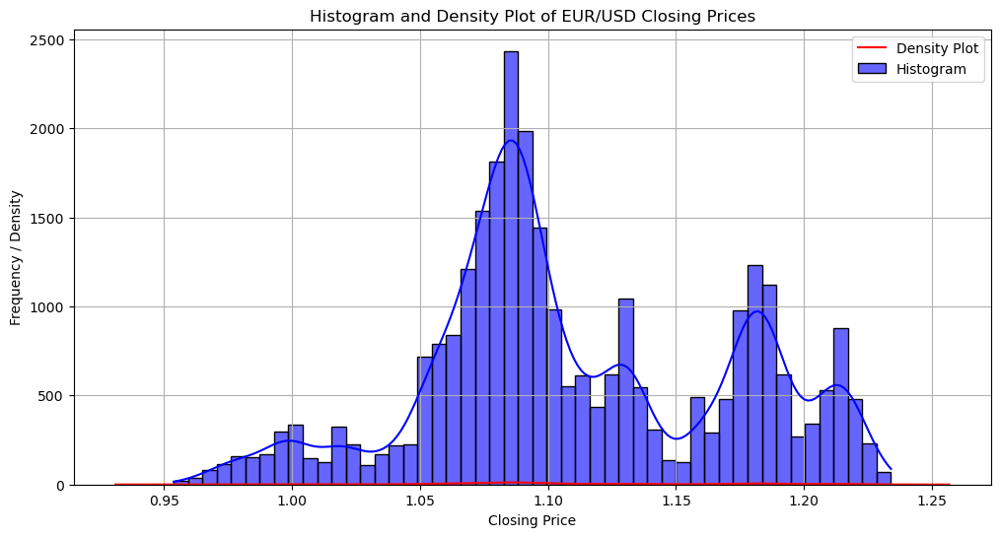

In [8]:
# Plot the histogram and density plot for the closing prices
plt.figure(figsize=(12, 6))

# Histogram
sns.histplot(df['close'], bins=50, kde=True, color='blue', label='Histogram', alpha=0.6)

# Density plot
sns.kdeplot(df['close'], color='red', label='Density Plot')

plt.title('Histogram and Density Plot of EUR/USD Closing Prices')
plt.xlabel('Closing Price')
plt.ylabel('Frequency / Density')
plt.legend()
plt.grid(True)
plt.show()

#### The distribution of EUR/USD closing prices is slightly positively skewed, with more prices concentrated at the lower end but some occasional higher values.
#### The distribution is close to normal and shows no extreme skewness or outliers, which suggests relative stability with occasional upward fluctuations.

### Polar Plots Showing the Statistiical Volumes of each Month

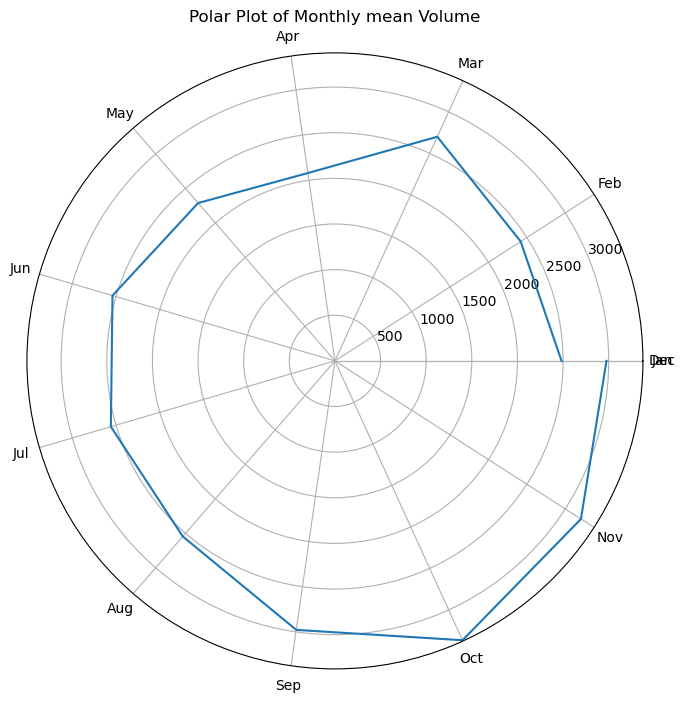

In [9]:
# Grouping the data by month, calculating the mean volume for each month 
monthly_mean = df.groupby('month')['tick_volume'].mean() 
  
# Polar Plot theta (angle) and radii (length) settings 
theta = np.linspace(0, 2 * np.pi, len(monthly_mean)) 
radii = monthly_mean.values 
  
# Polar Plot 
plt.figure(figsize=(8, 8)) 
plt.polar(theta, radii) 
plt.title('Polar Plot of Monthly mean Volume') 
plt.xticks(theta, ['Jan', 'Feb', 'Mar', 'Apr', 'May', 
                   'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']) 
  
# Set y-axis limit to accommodate the data 
plt.ylim(0, radii.max() + 10) 
plt.show() 

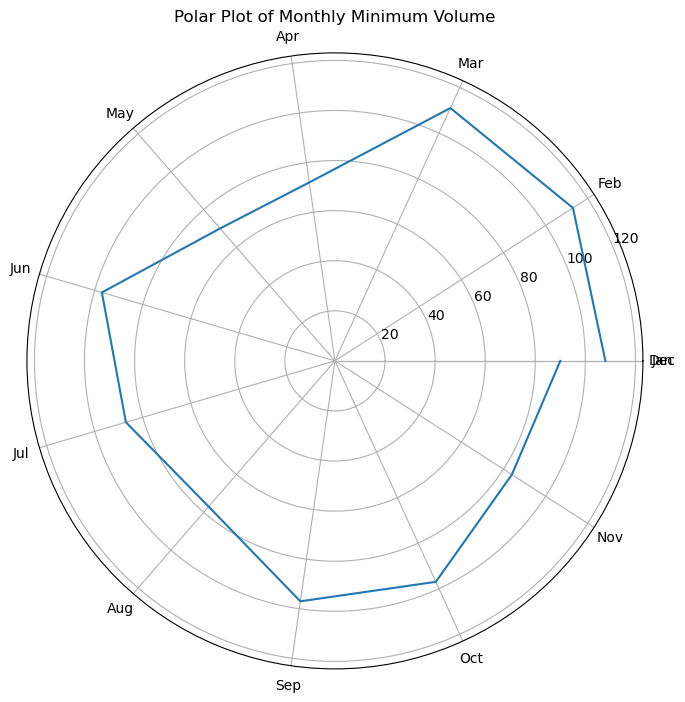

In [10]:
# Grouping the data by month, calculating the minimum volume for each month 
monthly_min = df.groupby('month')['tick_volume'].min() 
  
# Polar Plot theta (angle) and radii (length) settings 
theta = np.linspace(0, 2 * np.pi, len(monthly_min)) 
radii = monthly_min.values 
  
# Polar Plot 
plt.figure(figsize=(8, 8)) 
plt.polar(theta, radii) 
plt.title('Polar Plot of Monthly Minimum Volume') 
plt.xticks(theta, ['Jan', 'Feb', 'Mar', 'Apr', 'May', 
                   'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']) 
  
# Set y-axis limit to accommodate the data 
plt.ylim(0, radii.max() + 10) 
plt.show() 

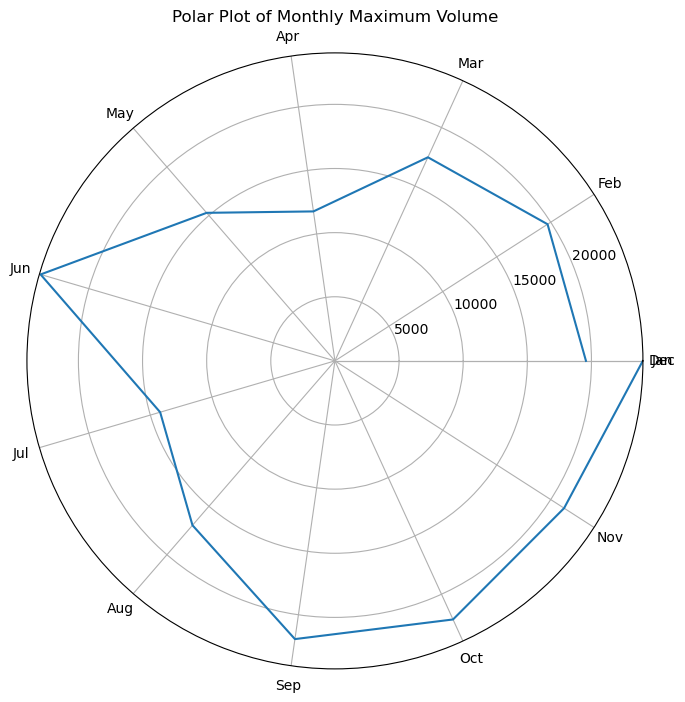

In [11]:
# Grouping the data by month, calculating the maximum volume for each month 
monthly_max = df.groupby('month')['tick_volume'].max() 
  
# Polar Plot theta (angle) and radii (length) settings 
theta = np.linspace(0, 2 * np.pi, len(monthly_max)) 
radii = monthly_max.values 
  
# Polar Plot 
plt.figure(figsize=(8, 8)) 
plt.polar(theta, radii) 
plt.title('Polar Plot of Monthly Maximum Volume') 
plt.xticks(theta, ['Jan', 'Feb', 'Mar', 'Apr', 'May', 
                   'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']) 
  
# Set y-axis limit to accommodate the data 
plt.ylim(0, radii.max() + 10) 
plt.show() 

#### The Polar plots of the trading volume shows that trading volume of the EURUSD is higher in the last quarter of the year.

### Plotting the highest and lowest price over time

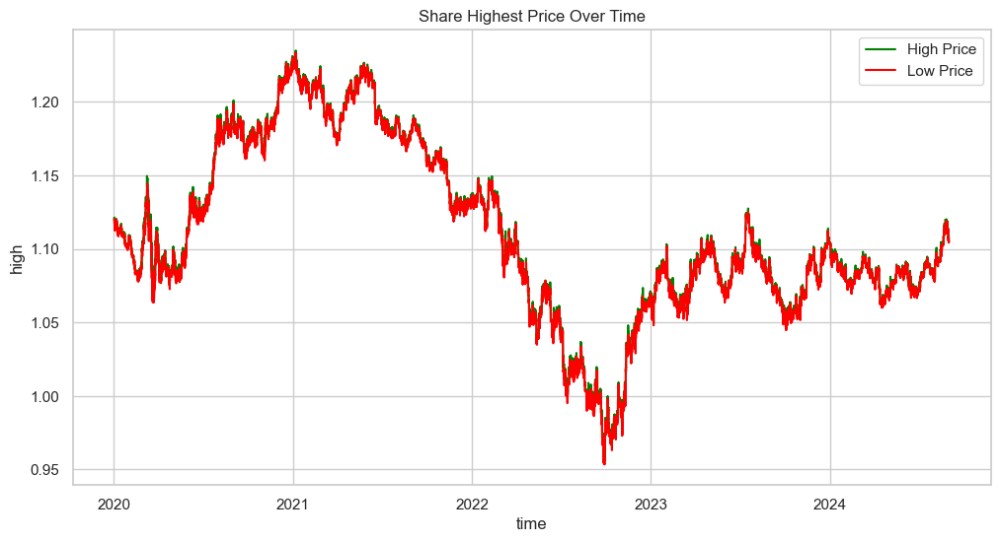

In [12]:
# Assuming df is your DataFrame
sns.set(style="whitegrid")  # Setting the style to whitegrid for a clean background
 
plt.figure(figsize=(12, 6))  # Setting the figure size
sns.lineplot(data=df, x='time', y='high', label='High Price', color='green')
sns.lineplot(data=df, x='time', y='low', label='Low Price', color='red')
 
# Adding labels and title
plt.xlabel('time')
plt.ylabel('high')
plt.title('Share Highest Price Over Time')
 
plt.show()

## Resampling the data into a monthly basis

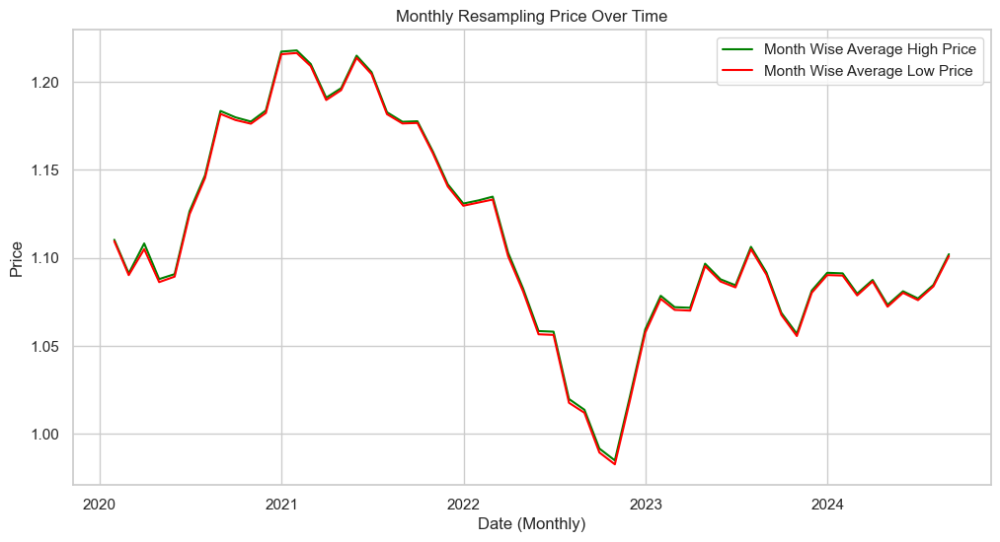

In [13]:
# Assuming df is your DataFrame with a datetime index
df_resampled_m = df.resample('M').mean()  # Resampling to monthly frequency, using mean as an aggregation function
 
sns.set(style="whitegrid")  # Setting the style to whitegrid for a clean background
 
# Plotting the 'high' column with seaborn, setting x as the resampled 'Date'
plt.figure(figsize=(12, 6))  # Setting the figure size
sns.lineplot(data=df_resampled_m, x=df_resampled_m.index, y='high', label='Month Wise Average High Price', color='green')
sns.lineplot(data=df_resampled_m, x=df_resampled_m.index, y='low', label='Month Wise Average Low Price', color='red')
 
# Adding labels and title
plt.xlabel('Date (Monthly)')
plt.ylabel('Price')
plt.title('Monthly Resampling Price Over Time')
 
plt.show()

## Resampling the data into a weekly basis

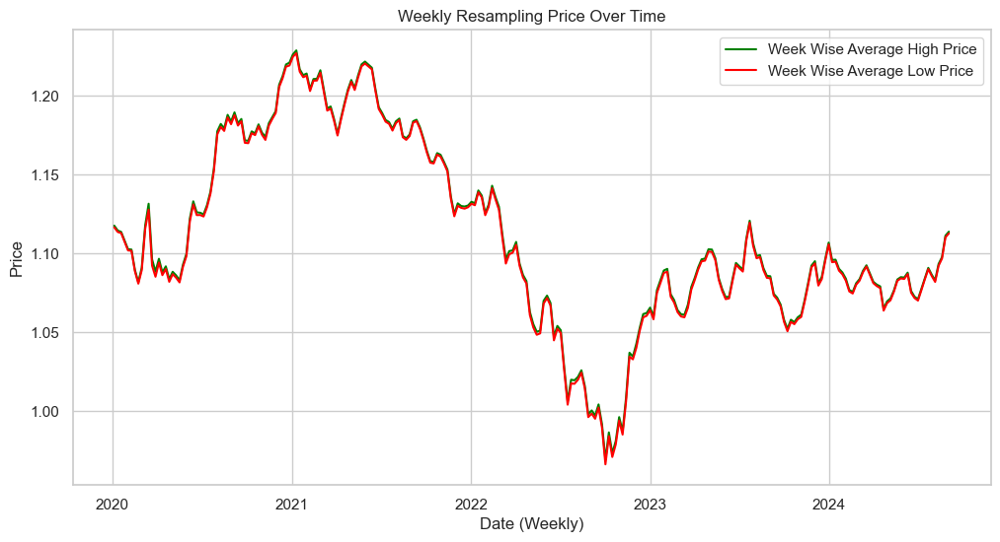

In [14]:
# Assuming df is your DataFrame with a datetime index
df_resampled_w = df.resample('W').mean()  # Resampling to weekly frequency, using mean as an aggregation function
 
sns.set(style="whitegrid")  # Setting the style to whitegrid for a clean background
 
# Plotting the 'high' column with seaborn, setting x as the resampled 'Date'
plt.figure(figsize=(12, 6))  # Setting the figure size
sns.lineplot(data=df_resampled_w, x=df_resampled_w.index, y='high', label='Week Wise Average High Price', color='green')
sns.lineplot(data=df_resampled_w, x=df_resampled_w.index, y='low', label='Week Wise Average Low Price', color='red')
 
# Adding labels and title
plt.xlabel('Date (Weekly)')
plt.ylabel('Price')
plt.title('Weekly Resampling Price Over Time')
 
plt.show()

## Resampling the data into a daily basis

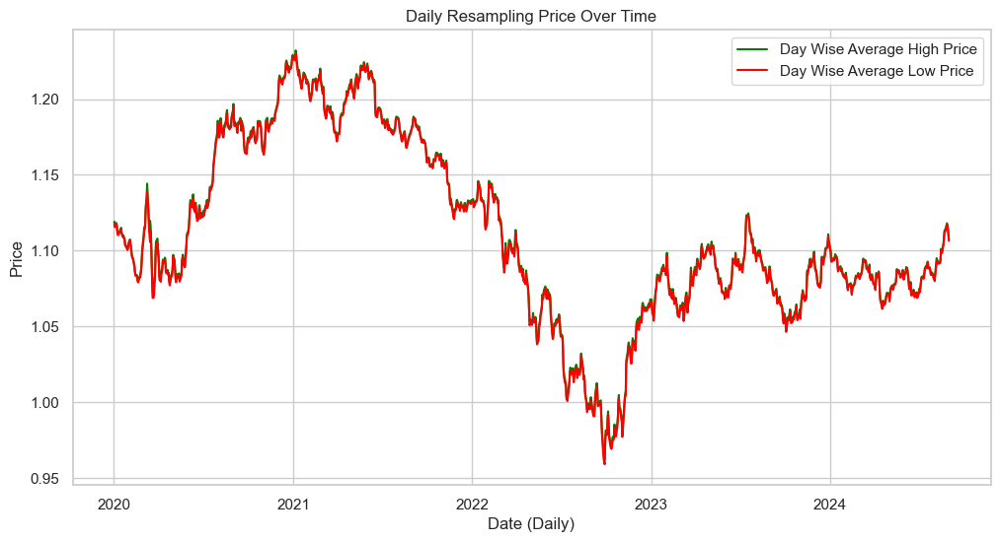

In [15]:
# Assuming df is your DataFrame with a datetime index
df_resampled_d = df.resample('D').mean()  # Resampling to daily frequency, using mean as an aggregation function
 
sns.set(style="whitegrid")  # Setting the style to whitegrid for a clean background
 
# Plotting the 'high' column with seaborn, setting x as the resampled 'Date'
plt.figure(figsize=(12, 6))  # Setting the figure size
sns.lineplot(data=df_resampled_d, x=df_resampled_d.index, y='high', label='Day Wise Average High Price', color='green')
sns.lineplot(data=df_resampled_d, x=df_resampled_d.index, y='low', label='Day Wise Average Low Price', color='red')
 
# Adding labels and title
plt.xlabel('Date (Daily)')
plt.ylabel('Price')
plt.title('Daily Resampling Price Over Time')
 
plt.show()

## Resampling the data into a 4-hourly basis

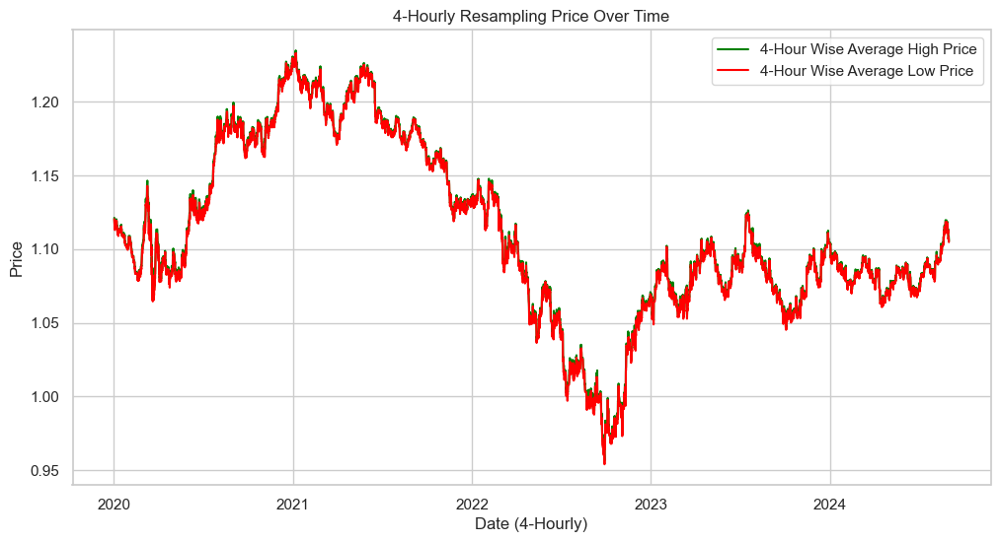

In [16]:
# Assuming df is your DataFrame with a datetime index
df_resampled_4h = df.resample('4H').mean()  # Resampling to hourly frequency, using mean as an aggregation function
 
sns.set(style="whitegrid")  # Setting the style to whitegrid for a clean background
 
# Plotting the 'high' column with seaborn, setting x as the resampled 'Date'
plt.figure(figsize=(12, 6))  # Setting the figure size
sns.lineplot(data=df_resampled_4h, x=df_resampled_4h.index, y='high', label='4-Hour Wise Average High Price', color='green')
sns.lineplot(data=df_resampled_4h, x=df_resampled_4h.index, y='low', label='4-Hour Wise Average Low Price', color='red')
 
# Adding labels and title
plt.xlabel('Date (4-Hourly)')
plt.ylabel('Price')
plt.title('4-Hourly Resampling Price Over Time')
 
plt.show()

### Detecting seasonality in the data using the Auto-correlation function

<Figure size 1800x1000 with 0 Axes>

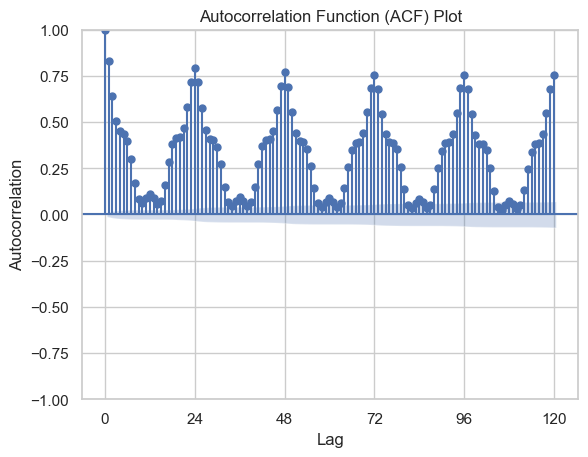

In [17]:
# If 'Date' is a column, but not the index, you can set it as the index
#df.set_index('time', inplace=True)
 
# Plot the ACF
plt.figure(figsize=(18, 10))
plot_acf(df['tick_volume'], lags=24*5)  # You can adjust the number of lags as needed
plt.xlabel('Lag')
plt.xticks(np.arange(0, 121, step=24))
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation Function (ACF) Plot')
plt.show()

<Figure size 1800x1000 with 0 Axes>

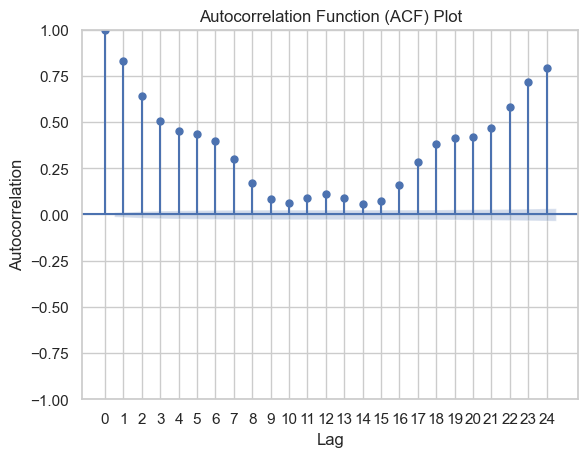

In [18]:
# If 'Date' is a column, but not the index, you can set it as the index
#df.set_index('time', inplace=True)
 
# Plot the ACF
plt.figure(figsize=(18, 10))
plot_acf(df['tick_volume'], lags=24)  # You can adjust the number of lags as needed
plt.xlabel('Lag')
plt.xticks(np.arange(0, 25, step=1))
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation Function (ACF) Plot')
plt.show()

#### Peaks at regular intervals in the trading volume indicate seasonality in the data

### Seasonal decomposition of the EURUSD

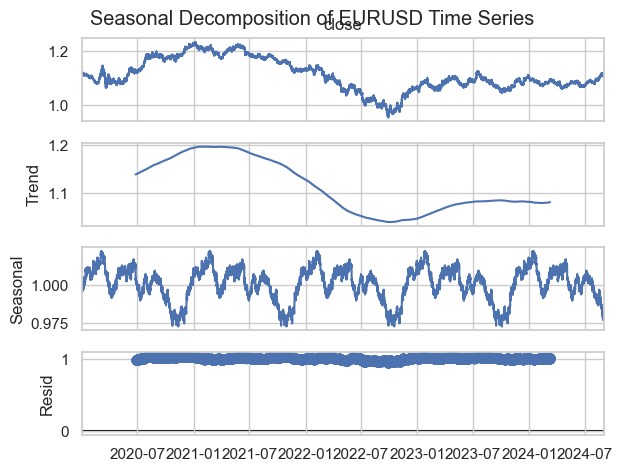

In [19]:
# Decompose the time series into trend, seasonal and residual components

result = seasonal_decompose(df['close'], model='multiplicative', period=24*250)  # Approx. yearly seasonality
result.plot()
plt.suptitle('Seasonal Decomposition of EURUSD Time Series')
#plt.tight_layout()
plt.show()

# Decompose the time series (closing price) using a multiplicative model
#decomposition = seasonal_decompose(df['close'], model='multiplicative', period=24*30)  # Approx. monthly seasonality



#### The peaks at regular intervals shows that seasonnality is present in the data. Below shows the seasonality present at different  intervals

### Seasonal component of a month

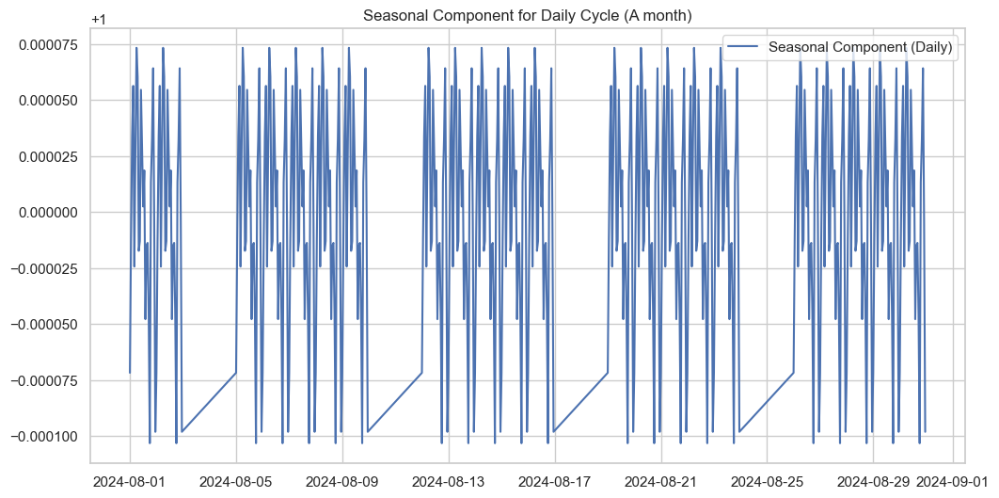

In [20]:
# Decompose the time series using a multiplicative model with a daily seasonality period (24 hours)
decomposition_daily = seasonal_decompose(df['close'], model='multiplicative', period=24)

# Isolate and plot the seasonal component for detailed analysis (a month of daily seasonality)
plt.figure(figsize=(12, 6))
plt.plot(decomposition_daily.seasonal[-24*22:], label='Seasonal Component (Daily)')
plt.title('Seasonal Component for Daily Cycle (A month)')
plt.grid(True)
plt.legend()
plt.show()

### Seasonal component of a week

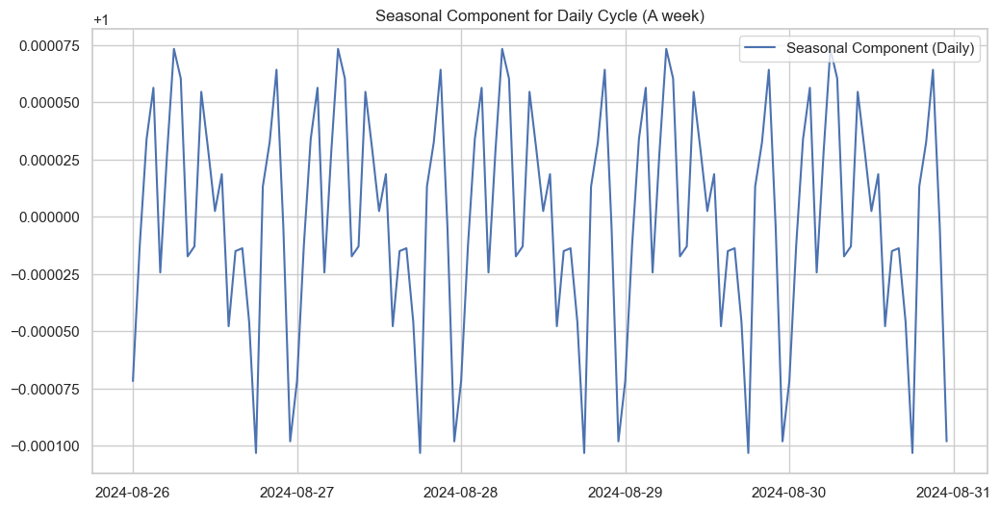

In [21]:
# Decompose the time series using a multiplicative model with a daily seasonality period (24 hours)
decomposition_daily = seasonal_decompose(df['close'], model='multiplicative', period=24)

# Isolate and plot the seasonal component for detailed analysis (a week of daily seasonality)
plt.figure(figsize=(12, 6))
plt.plot(decomposition_daily.seasonal[-24*5:], label='Seasonal Component (Daily)')
plt.title('Seasonal Component for Daily Cycle (A week)')
plt.grid(True)
plt.legend()
plt.show()

### Detecting stationarity using the Augmented Dickey-Fuller test

In [22]:
# Assuming df is your DataFrame
result = adfuller(df['close'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])

ADF Statistic: -1.5530432483914995
p-value: 0.507127702301824
Critical Values: {'1%': -3.4305753731670987, '5%': -2.8616396087241363, '10%': -2.5668230187056995}


#### The ADF Statistic < all Critical Values, So, we have enough evidence to reject the null hypothesis. The data appears to be stationary according to the Augmented Dickey-Fuller test.

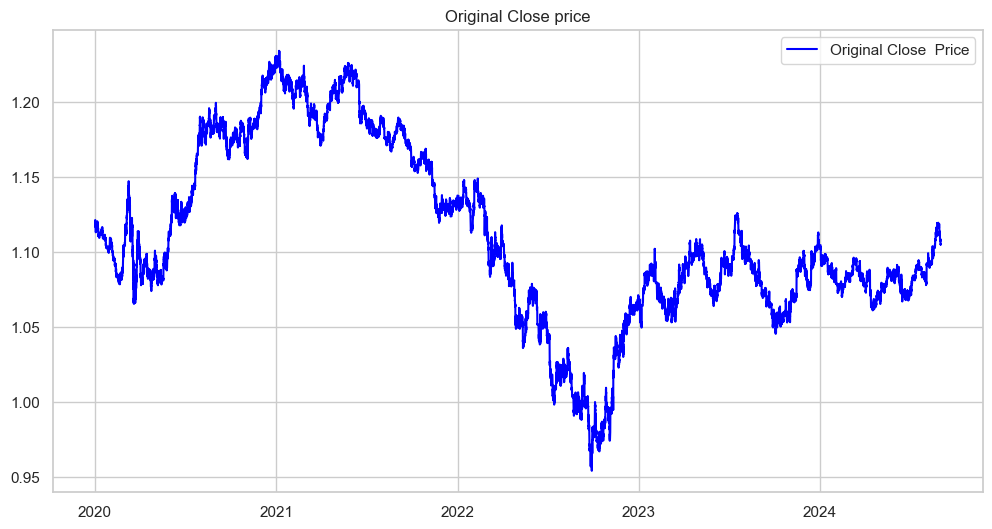

In [23]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(df['close'], label='Original Close  Price', color='blue')
plt.legend()
plt.title('Original Close price')
plt.show()

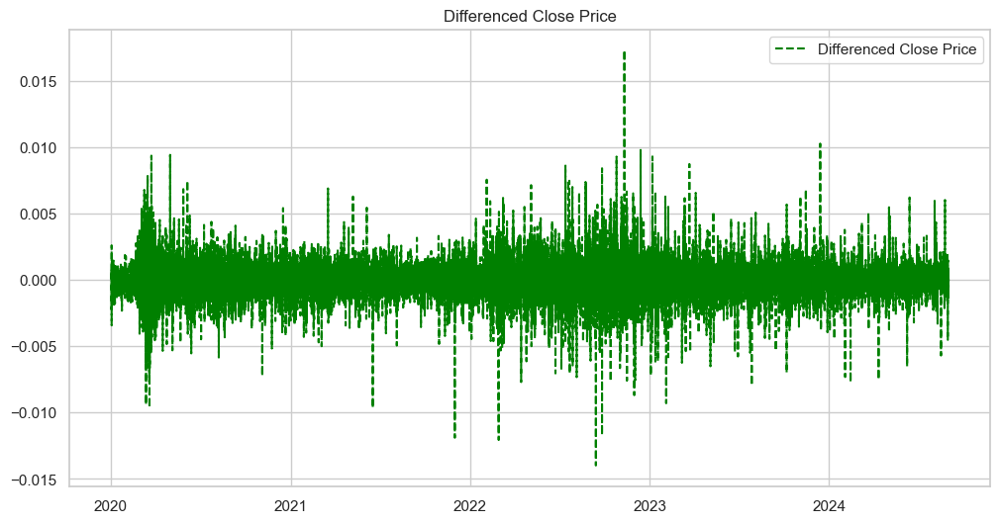

In [24]:
# Differencing
df['close_diff'] = df['close'].diff()
 
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(df['close_diff'], label='Differenced Close Price', linestyle='--', color='green')
plt.legend()
plt.title('Differenced Close Price')
plt.show()

#### The Differenced Close Price appears to be statitionary as there are no regular peaks at intervals but the Augmented Dickey-Fuller test will be applied again to confirm the assumptions.

### Showing the Simple Moving Average on the chart

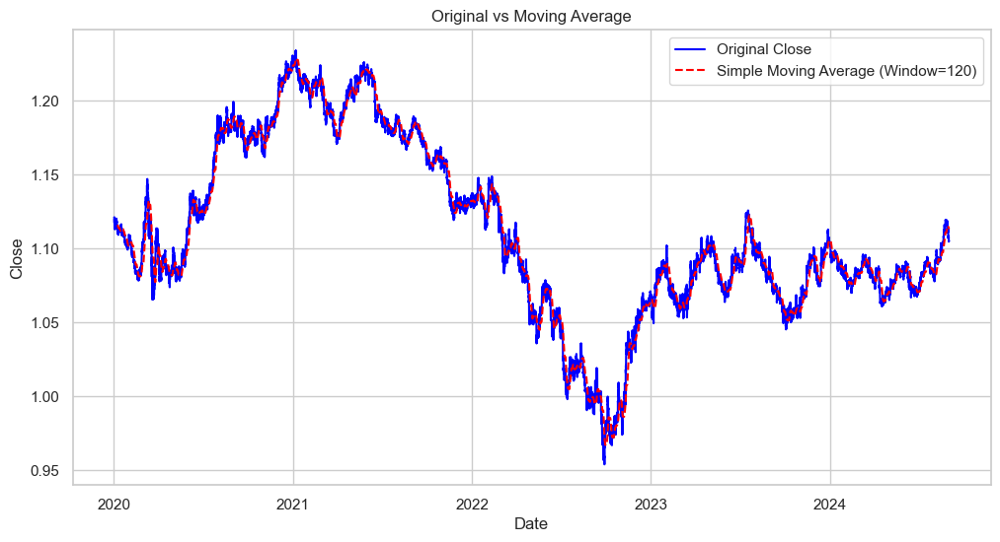

In [25]:
# Moving Average
window_size = 120
df['close_smoothed'] = df['close'].rolling(window=window_size).mean()
 
# Plotting
plt.figure(figsize=(12, 6))
 
plt.plot(df['close'], label='Original Close', color='blue')
plt.plot(df['close_smoothed'], label=f'Simple Moving Average (Window={window_size})', linestyle='--', color='red')
 
plt.xlabel('Date')
plt.ylabel('Close')
plt.title('Original vs Moving Average')
plt.legend()
plt.show()

### Showing the Exponential Moving Average on the chart

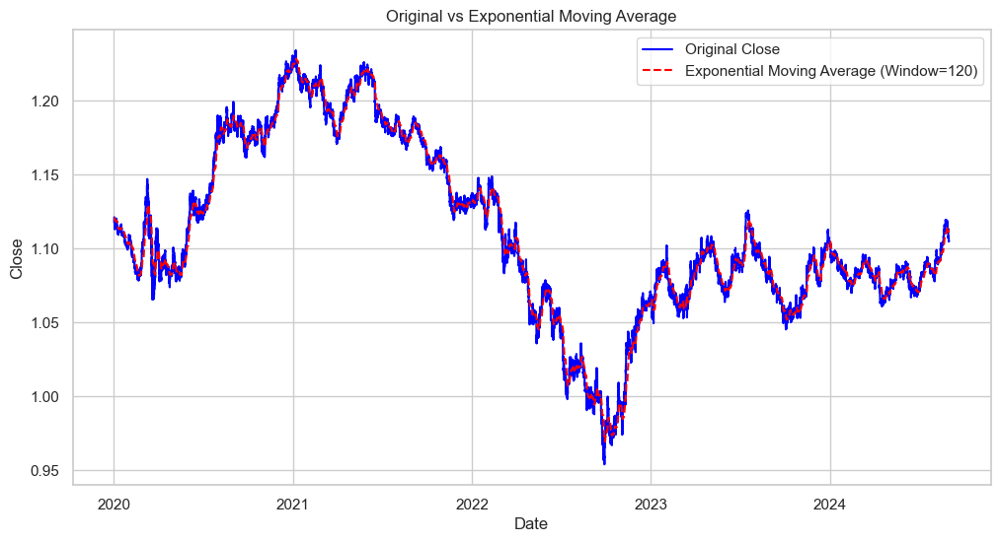

In [26]:
# Moving Average
e_window_size = 120
df['close_exponential'] = df['close'].ewm(span=e_window_size, adjust=False).mean()
 
# Plotting
plt.figure(figsize=(12, 6))
 
plt.plot(df['close'], label='Original Close', color='blue')
plt.plot(df['close_exponential'], label=f'Exponential Moving Average (Window={e_window_size})', linestyle='--', color='red')
 
plt.xlabel('Date')
plt.ylabel('Close')
plt.title('Original vs Exponential Moving Average')
plt.legend()
plt.show()

In [27]:
# Create a DataFrame with 'high' and 'high_diff' columns side by side
df_combined = pd.concat([df['close'], df['close_diff']], axis=1)
 
# Display the combined DataFrame
print(df_combined.head())

                       close  close_diff
time                                    
2020-01-02 09:00:00  1.12091         NaN
2020-01-02 10:00:00  1.12111     0.00020
2020-01-02 11:00:00  1.12022    -0.00089
2020-01-02 12:00:00  1.11975    -0.00047
2020-01-02 13:00:00  1.11840    -0.00135


In [28]:
# Remove rows with missing values
df.dropna(subset=['close_diff'], inplace=True)
df['close_diff'].head()

time
2020-01-02 10:00:00    0.00020
2020-01-02 11:00:00   -0.00089
2020-01-02 12:00:00   -0.00047
2020-01-02 13:00:00   -0.00135
2020-01-02 14:00:00    0.00082
Name: close_diff, dtype: float64

### Detecting stationarity again using the Augmented Dickey-Fuller test

In [29]:
result = adfuller(df['close_diff'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])

ADF Statistic: -29.55717794358124
p-value: 0.0
Critical Values: {'1%': -3.4305753731670987, '5%': -2.8616396087241363, '10%': -2.5668230187056995}


#### Since the p-value is now less than 0.05, we can reject the null hypothesis, confirming that the differenced series is stationary.

### Displaying the last five data in the updated dataframe

In [30]:
df.tail()

,open,high,low,close,tick_volume,spread,year,month,day,hour,close_diff,close_smoothed,close_exponential
time,,,,,,,,,,,,,
2024-08-30 19:00:00,1.10588,1.10588,1.10429,1.10486,3859,17,2024,8,30,19,-0.00103,1.113602,1.111178
2024-08-30 20:00:00,1.10486,1.10558,1.10474,1.10514,2318,17,2024,8,30,20,0.00028,1.113485,1.111078
2024-08-30 21:00:00,1.10514,1.10553,1.10486,1.10509,2198,17,2024,8,30,21,-0.00005,1.113372,1.110979
2024-08-30 22:00:00,1.10509,1.10538,1.10464,1.10516,2595,17,2024,8,30,22,0.00007,1.113256,1.110883
2024-08-30 23:00:00,1.10517,1.10542,1.10452,1.10461,1034,17,2024,8,30,23,-0.00055,1.113136,1.110779


## Model Development and Training

### Splitting the data into training and testing data

In [32]:
# Assuming df is your dataset with 'time' as the index and 'close' prices as the target variable

# Define the train-test split for the non-stationary data
train_size_o = len(df) - 500
train_data_o, test_data_o = df['close'].dropna()[:train_size_o], df['close'][train_size_o:]

# Define the train-test split for the stationary data
train_size = len(df) - 500
train_data, test_data = df['close_diff'].dropna()[:train_size], df['close_diff'][train_size:]

# Combine the train and test data into a DataFrame for comparison
train_test_df = pd.DataFrame({
    'Train Data': train_data,
    'Test Data': test_data
})

# Declare the steps to be used for forecasting
forecast_steps = 500

#last value of the training data 
last_train_value = df['close'].iloc[train_size - 1]

# Display the DataFrame to inspect the split
print(train_test_df.head())  # Displays the first few rows
print(train_test_df.tail())  # Displays the last few rows (to see the transition)

                     Train Data  Test Data
time                                      
2020-01-02 10:00:00     0.00020        NaN
2020-01-02 11:00:00    -0.00089        NaN
2020-01-02 12:00:00    -0.00047        NaN
2020-01-02 13:00:00    -0.00135        NaN
2020-01-02 14:00:00     0.00082        NaN
                     Train Data  Test Data
time                                      
2024-08-30 19:00:00         NaN   -0.00103
2024-08-30 20:00:00         NaN    0.00028
2024-08-30 21:00:00         NaN   -0.00005
2024-08-30 22:00:00         NaN    0.00007
2024-08-30 23:00:00         NaN   -0.00055


In [33]:
train_test_df.describe()

,Train Data,Test Data
count,28549.000000,500.000000
mean,-0.000001,0.000051
std,0.001094,0.000847
min,-0.013980,-0.005690
25%,-0.000470,-0.000320
50%,0.000010,0.000000
75%,0.000470,0.000383
max,0.017330,0.006040


In [34]:
train_percentage = (train_test_df['Train Data'].count() / (train_test_df['Train Data'].count() + train_test_df['Test Data'].count())) * 100
test_percentage = (train_test_df['Test Data'].count() / (train_test_df['Train Data'].count() + train_test_df['Test Data'].count())) * 100

print('Training data: '+ str(round(train_percentage, 2)) +'%')
print('Testing data: '+ str(round(test_percentage, 2)) +'%')

Training data: 98.28%
Testing data: 1.72%


### ARIMA model

In [35]:
# Build an ARIMA model on the differenced data
arima_model = ARIMA(train_data, order=(1, 1, 1))  # ARIMA(p=1, d=1, q=1)
arima_result = arima_model.fit()

# Forecast for the test period (500 hours)
arima_forecast = arima_result.forecast(steps=forecast_steps)

# Add the last value of the training data to forecasted differenced values to revert
arima_forecast_original_scale = arima_forecast.cumsum() + last_train_value

C:\Users\murit\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\murit\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\murit\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\murit\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\murit\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given wi

### Evaluation of the ARIMA model

In [36]:
# Calculate forecast errors (MAE, MSE, RMSE)
mae_arima = mean_absolute_error(test_data, arima_forecast)
mse_arima = mean_squared_error(test_data, arima_forecast)
rmse_arima = np.sqrt(mse_arima)

# Print SARIMA error metrics
error_metrics_arima = {
    'MAE': mae_arima,
    'MSE': mse_arima,
    'RMSE': rmse_arima
}
print('ARIMA Error Metrics:', error_metrics_arima)

ARIMA Error Metrics: {'MAE': 0.0005238110266520639, 'MSE': 7.157955985171496e-07, 'RMSE': 0.0008460470427329379}


### Showing a forecast of the data vs the actual data

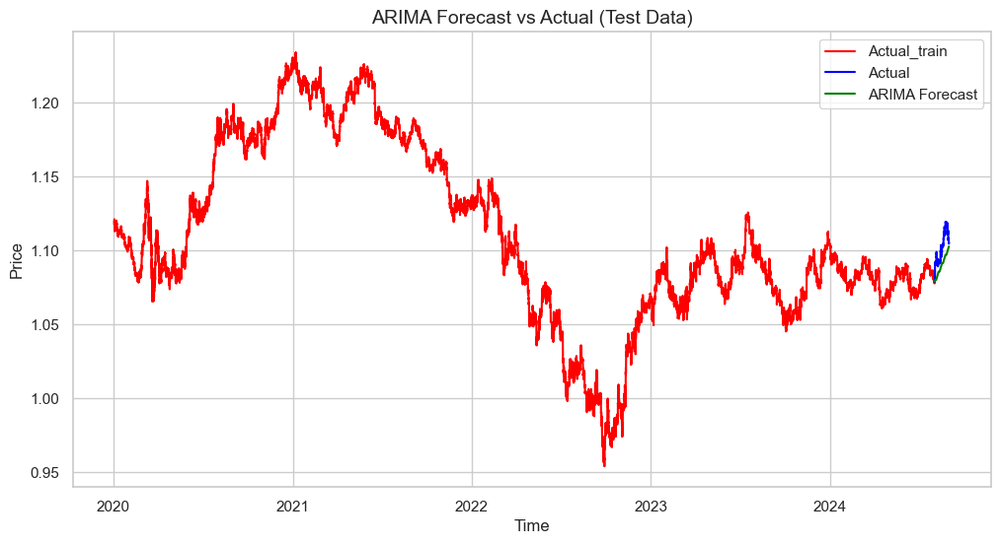

In [37]:
# Plot actual vs ARIMA forecast
plt.figure(figsize=(12, 6))
plt.plot(train_data_o.index, train_data_o, label='Actual_train', color='red')
plt.plot(test_data_o.index, test_data_o, label='Actual', color='blue')
plt.plot(test_data.index, arima_forecast_original_scale, label='ARIMA Forecast', color='green')
plt.title('ARIMA Forecast vs Actual (Test Data)', fontsize=14)
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

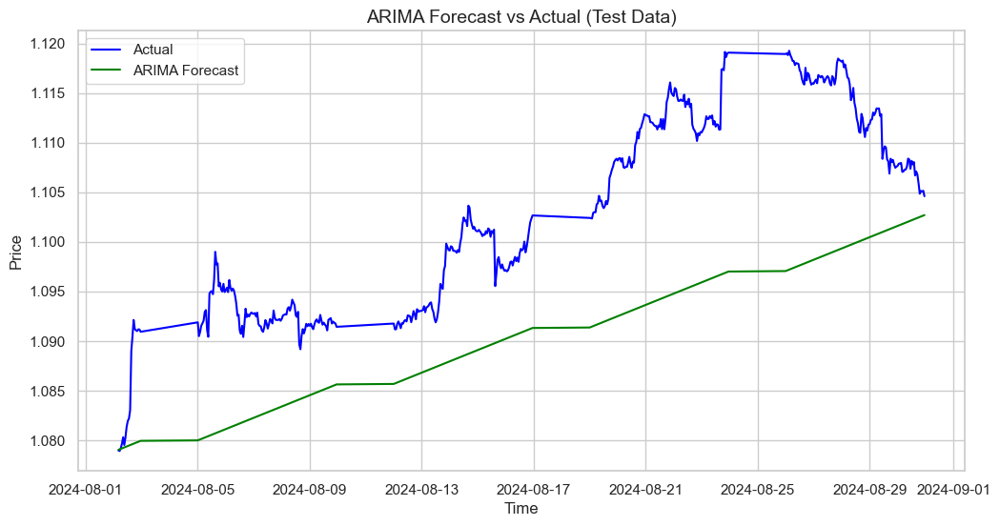

In [38]:
# Plot actual vs ARIMA forecast
plt.figure(figsize=(12, 6))
plt.plot(test_data_o.index, test_data_o, label='Actual', color='blue')
plt.plot(test_data.index, arima_forecast_original_scale, label='ARIMA Forecast', color='green')
plt.title('ARIMA Forecast vs Actual (Test Data)', fontsize=14)
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### SARIMA model

In [39]:
# Fit SARIMA model with daily seasonality (24 hours in a day)
seasonal_order = (1, 1, 1, 24)  # SARIMA with daily seasonality
sarima_model = SARIMAX(train_data, order=(1, 1, 1), seasonal_order=seasonal_order)
sarima_result = sarima_model.fit()

# Forecast for the test period (8000 hours)
sarima_forecast = sarima_result.forecast(steps=forecast_steps)

# Add the last value of the training data to forecasted differenced values to revert
sarima_forecast_original_scale = sarima_forecast.cumsum() + last_train_value

C:\Users\murit\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\murit\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\murit\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\murit\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



### Evaluation of the SARIMA model

In [40]:
# Calculate forecast errors (MAE, MSE, RMSE)
mae_sarima = mean_absolute_error(test_data, sarima_forecast_original_scale)
mse_sarima = mean_squared_error(test_data, sarima_forecast_original_scale)
rmse_sarima = np.sqrt(mse_sarima)

# Print SARIMA error metrics
error_metrics_sarima = {
    'MAE': mae_sarima,
    'MSE': mse_sarima,
    'RMSE': rmse_sarima
}
print('SARIMA Error Metrics:', error_metrics_sarima)

SARIMA Error Metrics: {'MAE': 1.0282862056038136, 'MSE': 1.0588113512316535, 'RMSE': 1.0289855933061713}


### Showing a forecast of the data vs the actual data

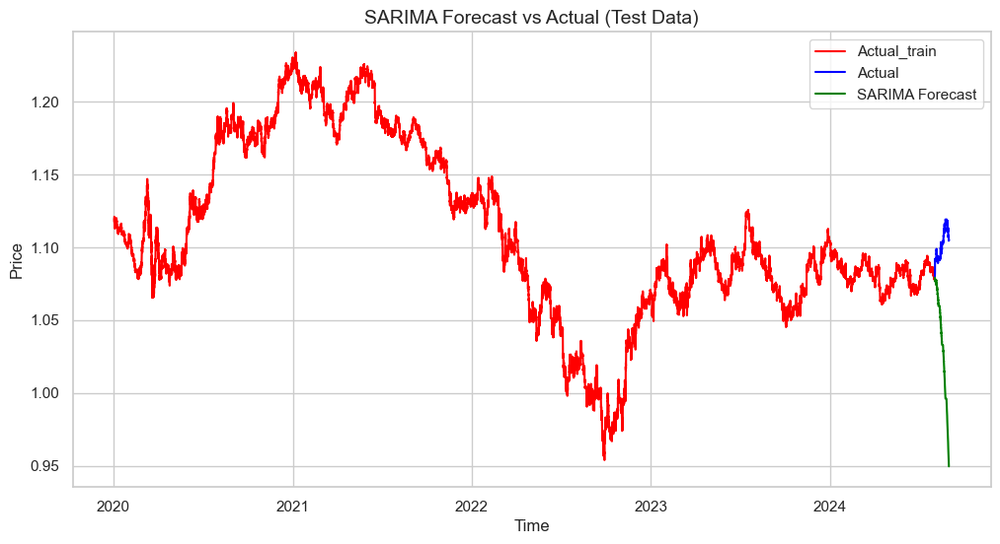

In [41]:
# Plot actual vs SARIMA forecast
plt.figure(figsize=(12, 6))
plt.plot(train_data_o.index, train_data_o, label='Actual_train', color='red')
plt.plot(test_data_o.index, test_data_o, label='Actual', color='blue')
plt.plot(test_data.index, sarima_forecast_original_scale, label='SARIMA Forecast', color='green')
plt.title('SARIMA Forecast vs Actual (Test Data)', fontsize=14)
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

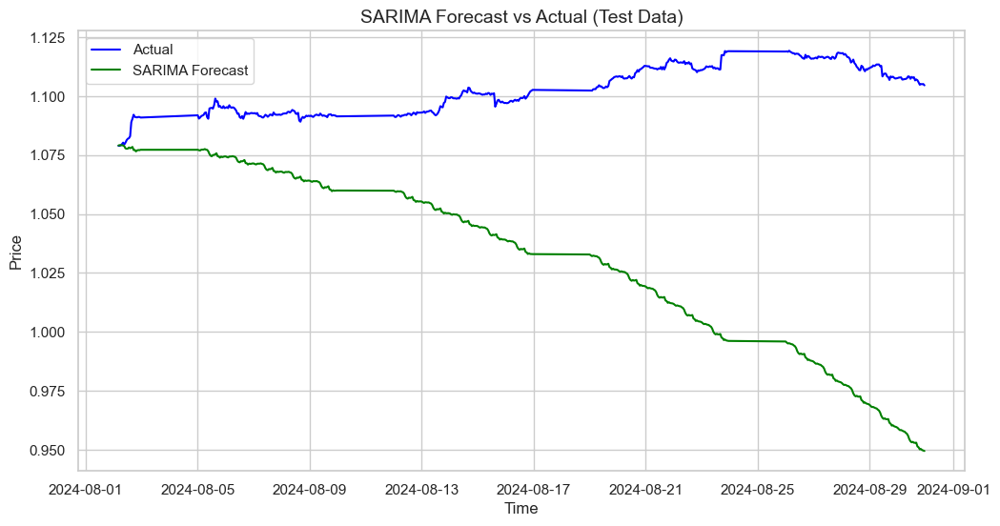

In [42]:
# Plot actual vs SARIMA forecast
plt.figure(figsize=(12, 6))
plt.plot(test_data_o.index, test_data_o, label='Actual', color='blue')
plt.plot(test_data.index, sarima_forecast_original_scale, label='SARIMA Forecast', color='green')
plt.title('SARIMA Forecast vs Actual (Test Data)', fontsize=14)
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

### Exponential Smoothing model

In [47]:
# Fit Exponential Smoothing model
exp_smoothing_model = ExponentialSmoothing(train_data, trend='add', seasonal='add', seasonal_periods=24)
exp_smoothing_fit = exp_smoothing_model.fit()

# Forecast the test period
exp_smoothing_forecast = exp_smoothing_fit.forecast(steps=forecast_steps)

# Add the last value of the training data to forecasted differenced values to revert
exp_smoothing_forecast_original_scale = exp_smoothing_forecast.cumsum() + last_train_value

C:\Users\murit\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\murit\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\murit\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



### Evaluation of the Exponential Smoothing model

In [52]:
# Calculate error metrics
mae_exp = mean_absolute_error(test_data, exp_smoothing_forecast_original_scale)
mse_exp = mean_squared_error(test_data, exp_smoothing_forecast_original_scale)
rmse_exp = np.sqrt(mse_exp)

# Print SARIMA error metrics
error_metrics_sarima = {
    'MAE': mae_exp,
    'MSE': mse_exp,
    'RMSE': rmse_exp
}

# Print error metrics for Exponential Smoothing
print(f'Exponential Smoothing MAE: {mae_exp:.4f}')
print(f'Exponential Smoothing MSE: {mse_exp:.4f}')
print(f'Exponential Smoothing RMSE: {rmse_exp:.4f}')

Exponential Smoothing MAE: 1.0772
Exponential Smoothing MSE: 1.1605
Exponential Smoothing RMSE: 1.0772


### Showing a forecast of the data vs the actual data

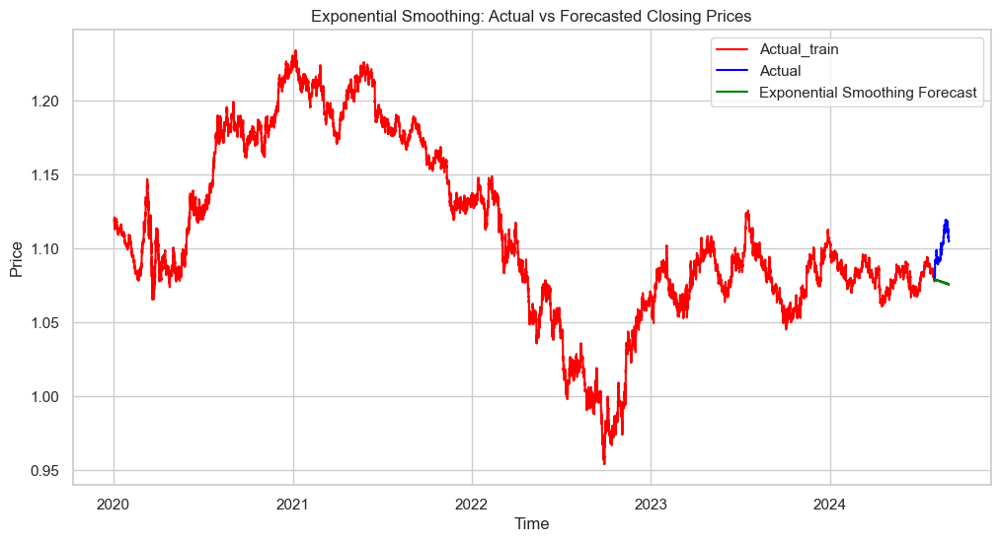

In [49]:
# Plot the actual vs forecasted values for Exponential Smoothing
plt.figure(figsize=(12, 6))
plt.plot(train_data_o.index, train_data_o, label='Actual_train', color='red')
plt.plot(test_data_o.index, test_data_o, label='Actual', color='blue')
plt.plot(test_data.index, exp_smoothing_forecast_original_scale, label='Exponential Smoothing Forecast', color='green')
plt.title('Exponential Smoothing: Actual vs Forecasted Closing Prices')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

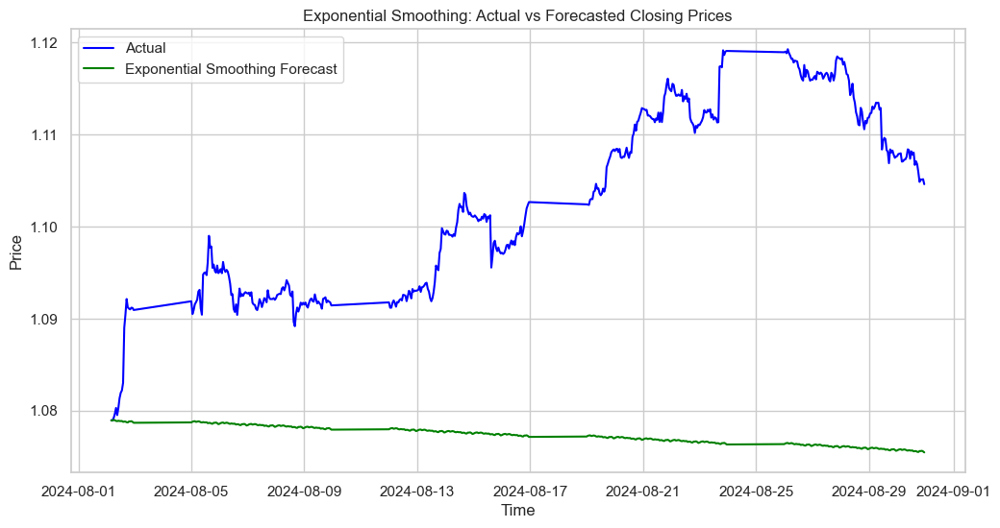

In [51]:
# Plot the actual vs forecasted values for Exponential Smoothing
plt.figure(figsize=(12, 6))
plt.plot(test_data_o.index, test_data_o, label='Actual', color='blue')
plt.plot(test_data.index, exp_smoothing_forecast_original_scale, label='Exponential Smoothing Forecast', color='green')
plt.title('Exponential Smoothing: Actual vs Forecasted Closing Prices')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

## Conclusion

In [54]:
evaluation = {
    "ARIMA": [mae_arima, mse_arima, rmse_arima],
    "SARIMA": [mae_sarima, mse_sarima, rmse_sarima],
    "Exponential Smoothing": [mae_exp, mse_exp, rmse_exp],
}

evaluation_df = pd.DataFrame(evaluation, index = ["Mean Average Error", "Mean Squared Error", "Root Meean Squared Errror"])
evaluation_df

,ARIMA,SARIMA,Exponential Smoothing
Mean Average Error,5.238110e-04,1.028286,1.077249
Mean Squared Error,7.157956e-07,1.058811,1.160466
Root Meean Squared Errror,8.460470e-04,1.028986,1.077249


### It can be seen that the ARIMA model performed best with very little errors and accurating forecasting the test data. The SARIMA model and Exponential Smooting  models performed similarly to each other.